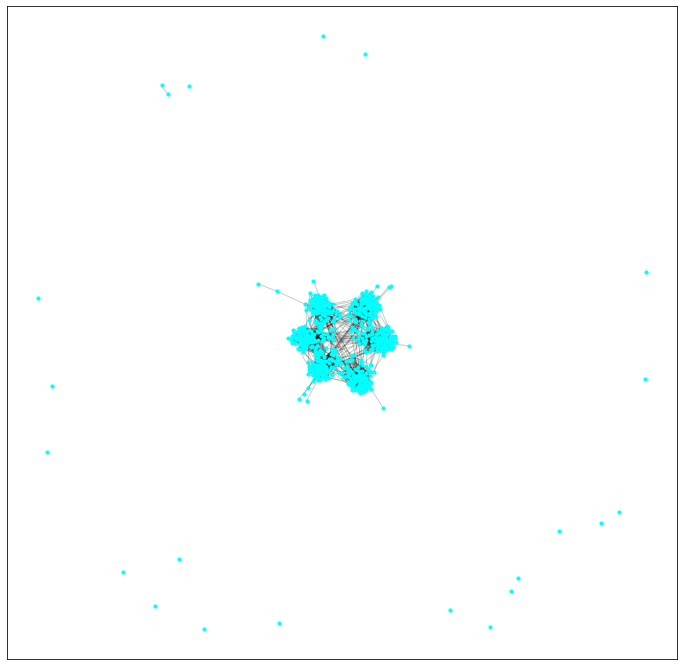

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Create a graph
G = nx.Graph()

# Parameters
num_clusters = 6  # Number of clusters
nodes_per_cluster = 100  # Nodes per cluster
inter_cluster_edges = 200  # Number of inter-cluster edges
isolated_nodes = 30  # Number of isolated nodes

# Create clusters
for cluster in range(num_clusters):
    # Create a dense graph for each cluster
    cluster_graph = nx.barabasi_albert_graph(nodes_per_cluster, 5)  # dense core
    G = nx.disjoint_union(G, cluster_graph)  # Add each cluster disjointly to the graph

# Connect clusters with random edges
for _ in range(inter_cluster_edges):
    node1 = random.randint(0, G.number_of_nodes() - 1)
    node2 = random.randint(0, G.number_of_nodes() - 1)
    if node1 != node2:
        G.add_edge(node1, node2)

# Add isolated nodes (nodes with few or no connections)
for i in range(isolated_nodes):
    G.add_node(G.number_of_nodes() + 1)
    if random.random() > 0.5:  # Random chance of connection
        G.add_edge(G.number_of_nodes() - 1, random.randint(0, G.number_of_nodes() - 1))

# Draw the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # spring layout for better node spacing
nx.draw_networkx_nodes(G, pos, node_size=10, node_color="cyan")
nx.draw_networkx_edges(G, pos, alpha=0.2)
plt.show()

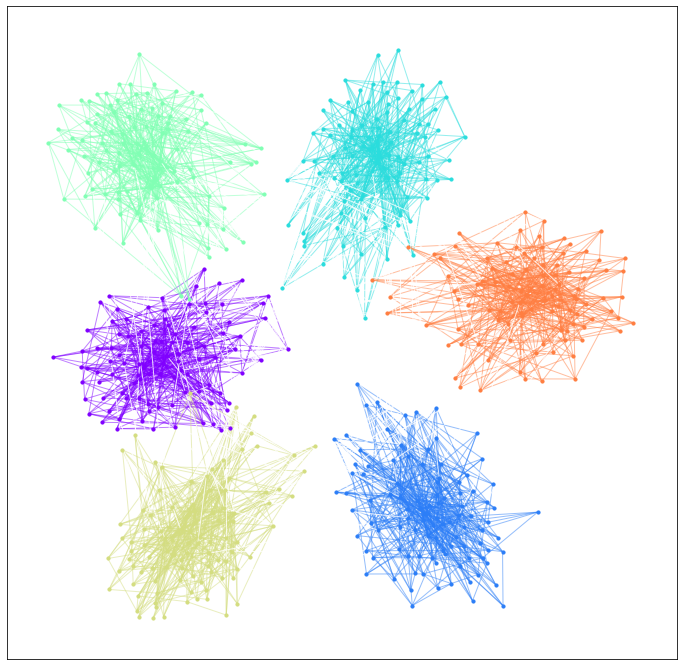

In [4]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Create a graph
G = nx.Graph()

# Parameters
num_clusters = 6  # Number of clusters
nodes_per_cluster = 100  # Nodes per cluster
inter_cluster_edges = 200  # Number of inter-cluster edges
isolated_nodes = 30  # Number of isolated nodes

# Color palette for clusters
colors = plt.cm.rainbow([i / num_clusters for i in range(num_clusters)])

# Create clusters
node_cluster_map = {}  # To map nodes to their clusters
for cluster in range(num_clusters):
    # Create a dense graph for each cluster
    cluster_graph = nx.barabasi_albert_graph(nodes_per_cluster, 5)  # dense core
    G = nx.disjoint_union(G, cluster_graph)  # Add each cluster disjointly to the graph

    # Map nodes to their respective clusters
    for node in range(G.number_of_nodes() - nodes_per_cluster, G.number_of_nodes()):
        node_cluster_map[node] = cluster

# Connect clusters with random edges (inter-cluster links)
inter_cluster_edges_list = []
for _ in range(inter_cluster_edges):
    node1 = random.randint(0, G.number_of_nodes() - 1)
    node2 = random.randint(0, G.number_of_nodes() - 1)
    if node1 != node2 and node_cluster_map.get(node1) != node_cluster_map.get(node2):
        G.add_edge(node1, node2)
        inter_cluster_edges_list.append((node1, node2))

# Add isolated nodes (nodes with few or no connections)
for i in range(isolated_nodes):
    G.add_node(G.number_of_nodes() + 1)
    if random.random() > 0.5:  # Random chance of connection
        G.add_edge(G.number_of_nodes() - 1, random.randint(0, G.number_of_nodes() - 1))

# Draw the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # spring layout for better node spacing

# Draw each cluster with its own color
for cluster in range(num_clusters):
    nodes_in_cluster = [node for node, clust in node_cluster_map.items() if clust == cluster]
    nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_cluster, node_size=10, node_color=[colors[cluster]])

    # Draw intra-cluster edges (edges within the same cluster)
    intra_cluster_edges = [(u, v) for u, v in G.edges(nodes_in_cluster)
                           if node_cluster_map.get(u) == node_cluster_map.get(v)]
    nx.draw_networkx_edges(G, pos, edgelist=intra_cluster_edges, edge_color=colors[cluster], alpha=0.5, connectionstyle='arc3,rad=0.1')

# Draw inter-cluster edges (edges between different clusters) in white
nx.draw_networkx_edges(G, pos, edgelist=inter_cluster_edges_list, edge_color="white", alpha=0.8, connectionstyle='arc3,rad=0.3')

plt.show()

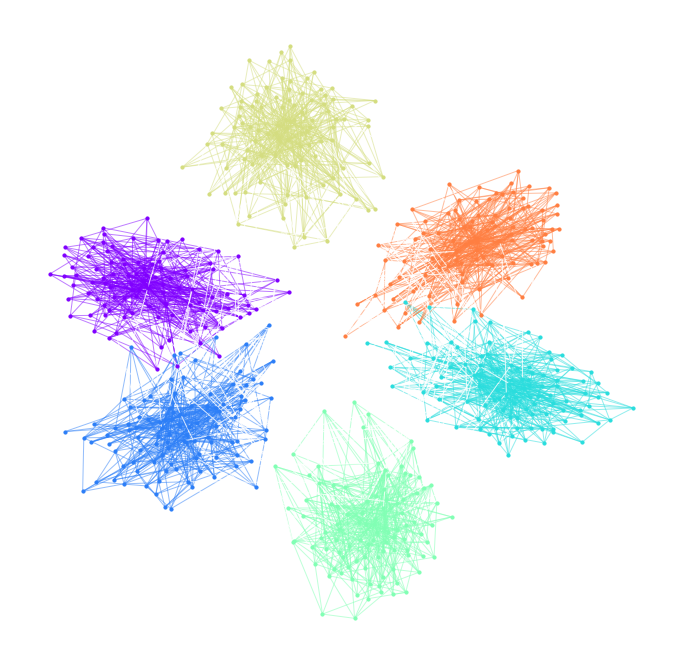

In [7]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Create a graph
G = nx.Graph()

# Parameters
num_clusters = 6  # Number of clusters
nodes_per_cluster = 100  # Nodes per cluster
inter_cluster_edges = 200  # Number of inter-cluster edges
isolated_nodes = 30  # Number of isolated nodes

# Color palette for clusters
colors = plt.cm.rainbow([i / num_clusters for i in range(num_clusters)])

# Create clusters
node_cluster_map = {}  # To map nodes to their clusters
for cluster in range(num_clusters):
    # Create a dense graph for each cluster
    cluster_graph = nx.barabasi_albert_graph(nodes_per_cluster, 5)  # dense core
    G = nx.disjoint_union(G, cluster_graph)  # Add each cluster disjointly to the graph

    # Map nodes to their respective clusters
    for node in range(G.number_of_nodes() - nodes_per_cluster, G.number_of_nodes()):
        node_cluster_map[node] = cluster

# Connect clusters with random edges (inter-cluster links)
inter_cluster_edges_list = []
for _ in range(inter_cluster_edges):
    node1 = random.randint(0, G.number_of_nodes() - 1)
    node2 = random.randint(0, G.number_of_nodes() - 1)
    if node1 != node2 and node_cluster_map.get(node1) != node_cluster_map.get(node2):
        G.add_edge(node1, node2)
        inter_cluster_edges_list.append((node1, node2))

# Add isolated nodes (nodes with few or no connections)
for i in range(isolated_nodes):
    G.add_node(G.number_of_nodes() + 1)
    if random.random() > 0.5:  # Random chance of connection
        G.add_edge(G.number_of_nodes() - 1, random.randint(0, G.number_of_nodes() - 1))

# Draw the graph with black background
plt.figure(figsize=(12, 12))
plt.gca().set_facecolor('black')  # Set the background to black
pos = nx.spring_layout(G)  # spring layout for better node spacing

# Draw each cluster with its own color
for cluster in range(num_clusters):
    nodes_in_cluster = [node for node, clust in node_cluster_map.items() if clust == cluster]
    nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_cluster, node_size=10, node_color=[colors[cluster]])

    # Draw intra-cluster edges (edges within the same cluster)
    intra_cluster_edges = [(u, v) for u, v in G.edges(nodes_in_cluster)
                           if node_cluster_map.get(u) == node_cluster_map.get(v)]
    nx.draw_networkx_edges(G, pos, edgelist=intra_cluster_edges, edge_color=colors[cluster], alpha=0.5, 
                           connectionstyle='arc3,rad=0.2')  # Curved intra-cluster edges

# Draw inter-cluster edges (edges between different clusters) in white, curved
nx.draw_networkx_edges(G, pos, edgelist=inter_cluster_edges_list, edge_color="white", alpha=0.8, 
                       connectionstyle='arc3,rad=0.5')  # Larger curve for inter-cluster edges

plt.axis('off')  # Turn off the axis
plt.show()

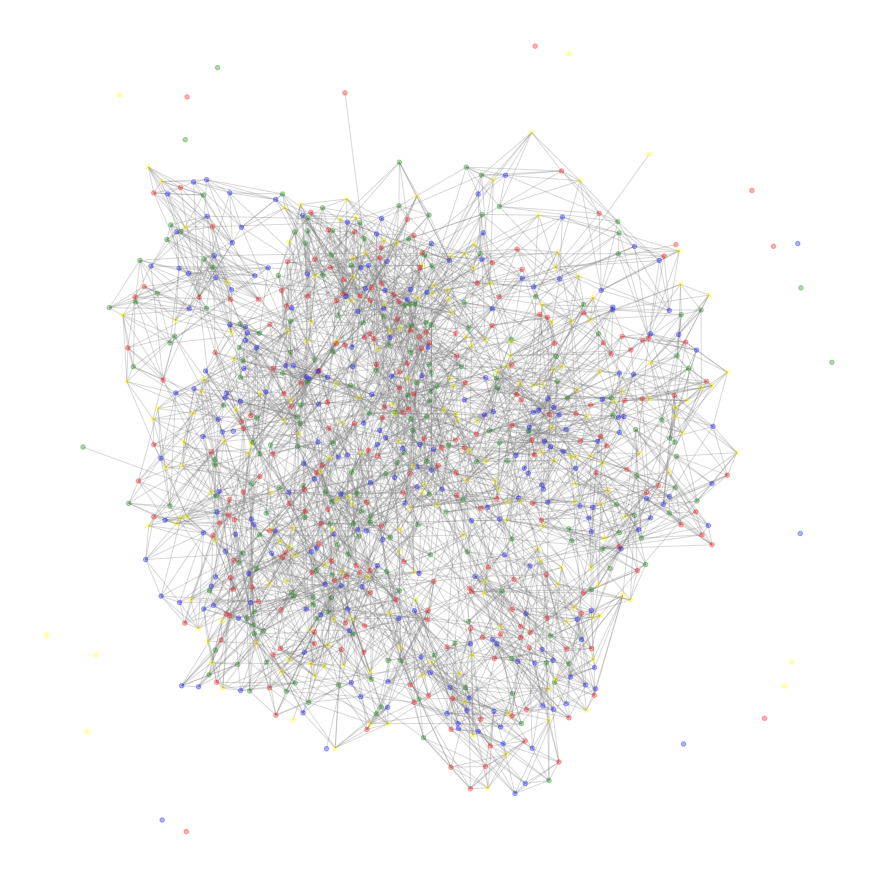

In [5]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Create a graph
G = nx.Graph()

# Parameters for a more complex look
num_groups = 6
nodes_per_group = 150
edges_between_groups = 300
isolated_nodes = 30
edge_probability = 0.05

# Create more defined clusters with different colors
group_colors = ['red', 'yellow', 'green', 'blue', 'orange', 'purple']
node_color_map = []

for group in range(num_groups):
    # Use dense intra-group connections
    group_graph = nx.watts_strogatz_graph(nodes_per_group, 8, edge_probability)  # Small-world network for complexity
    mapping = {i: i + group * nodes_per_group for i in range(nodes_per_group)}
    group_graph = nx.relabel_nodes(group_graph, mapping)
    G.add_edges_from(group_graph.edges())
    
    node_color_map += [group_colors[group]] * nodes_per_group

# Randomly connect nodes from different groups
for _ in range(edges_between_groups):
    node1 = random.randint(0, G.number_of_nodes() - 1)
    node2 = random.randint(0, G.number_of_nodes() - 1)
    if node1 != node2:
        G.add_edge(node1, node2)

# Add some isolated or sparsely connected nodes
for i in range(isolated_nodes):
    G.add_node(G.number_of_nodes() + 1)
    node_color_map.append('gray')
    if random.random() > 0.7:  # Some isolated nodes will have few connections
        G.add_edge(G.number_of_nodes() - 1, random.randint(0, G.number_of_nodes() - 1))

# Regenerate node_color_map with the correct length
node_color_map = [random.choice(['blue', 'green', 'red', 'yellow']) for _ in range(len(G.nodes()))]

# Now draw the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42, k=0.15)  # Compact the layout
nx.draw(G, pos, node_color=node_color_map, node_size=20, edge_color="gray", alpha=0.3, with_labels=False)
plt.show()


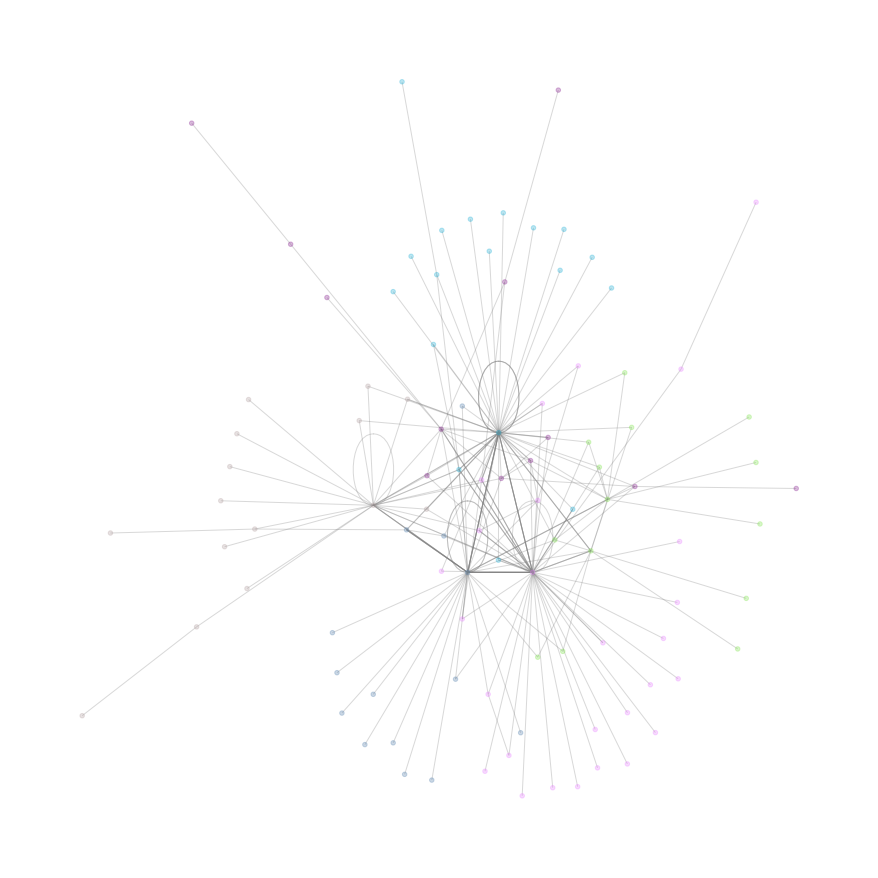

In [12]:
import networkx as nx
import matplotlib.pyplot as plt
import community.community_louvain as community_louvain  # For the Louvain method
import random

# Generate a scale-free graph or use your existing graph structure
G = nx.scale_free_graph(100)

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
# There will be as many colors as unique clusters
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for cluster in unique_clusters}

# Map the colors to the nodes based on their cluster
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Visualize the network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42, k=0.15)  # Layout for nodes
nx.draw(G, pos, node_color=node_color_map, node_size=20, edge_color="gray", alpha=0.3, with_labels=False)
plt.show()

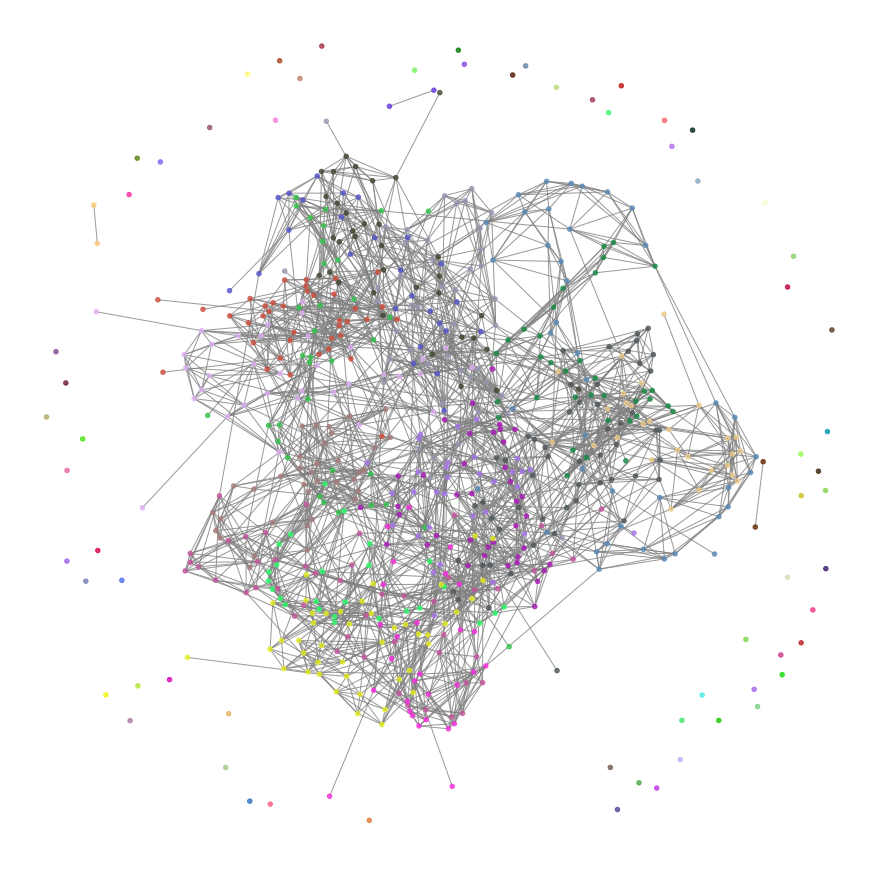

In [17]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import community.community_louvain as community_louvain  # For the Louvain method

# Create a graph
G = nx.Graph()

# Parameters for a more complex look
num_groups = 6
nodes_per_group = 100
edges_between_groups = 200
isolated_nodes = 100
edge_probability = 0.02

# Create more defined clusters
group_colors = ['red', 'yellow', 'green', 'blue', 'orange', 'purple']
node_color_map = []

for group in range(num_groups):
    # Use dense intra-group connections
    group_graph = nx.watts_strogatz_graph(nodes_per_group, 8, edge_probability)  # Small-world network for complexity
    mapping = {i: i + group * nodes_per_group for i in range(nodes_per_group)}
    group_graph = nx.relabel_nodes(group_graph, mapping)
    G.add_edges_from(group_graph.edges())
    
    node_color_map += [group_colors[group]] * nodes_per_group

# Randomly connect nodes from different groups
for _ in range(edges_between_groups):
    node1 = random.randint(0, G.number_of_nodes() - 1)
    node2 = random.randint(0, G.number_of_nodes() - 1)
    if node1 != node2:
        G.add_edge(node1, node2)

# Add some isolated or sparsely connected nodes
for i in range(isolated_nodes):
    G.add_node(G.number_of_nodes() + 1)
    node_color_map.append('gray')
    if random.random() > 0.7:  # Some isolated nodes will have few connections
        G.add_edge(G.number_of_nodes() - 1, random.randint(0, G.number_of_nodes() - 1))

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for cluster in unique_clusters}

# Map the colors to the nodes based on their Louvain cluster
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Visualize the network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42, k=0.15)  # Layout for nodes
nx.draw(G, pos, node_color=node_color_map, node_size=20, edge_color="gray", alpha=0.4, with_labels=False)
plt.show()


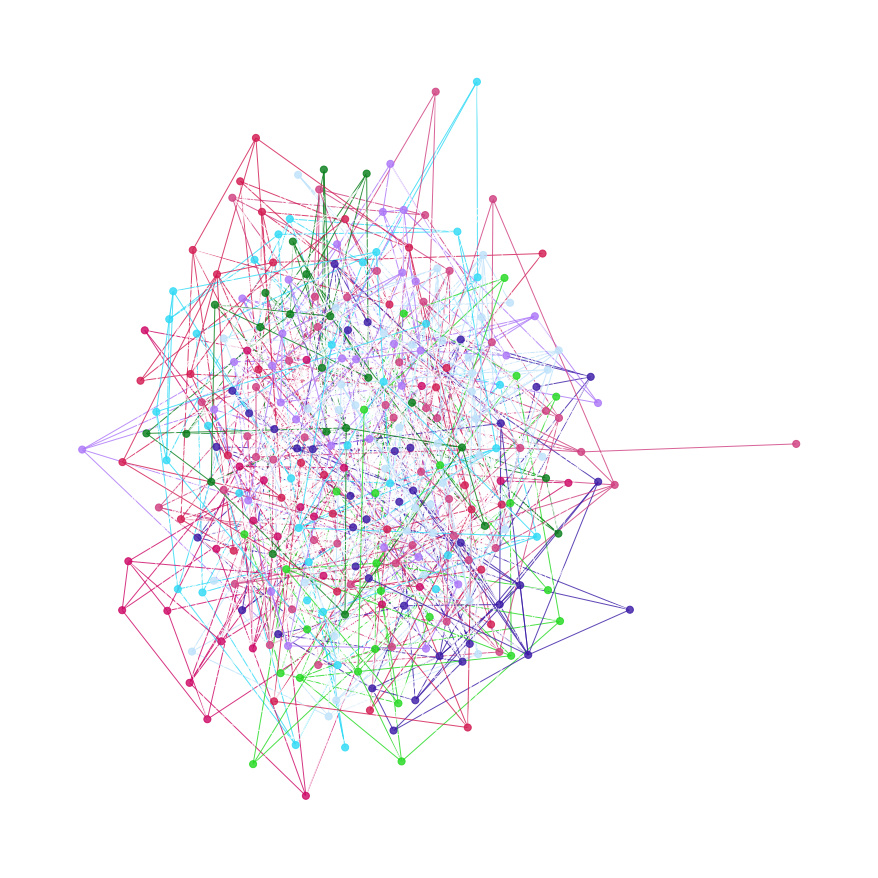

In [18]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain  # For the Louvain method
import random

# Create a graph with some modular structure (e.g., a scale-free or random graph)
G = nx.erdos_renyi_graph(300, 0.05)  # A random graph with 300 nodes and 5% probability of edge creation

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)])
             for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42, k=0.1)  # Layout for nodes
nx.draw(G, pos, node_color=node_color_map, edge_color=edge_colors, node_size=50, alpha=0.8, with_labels=False)
plt.show()

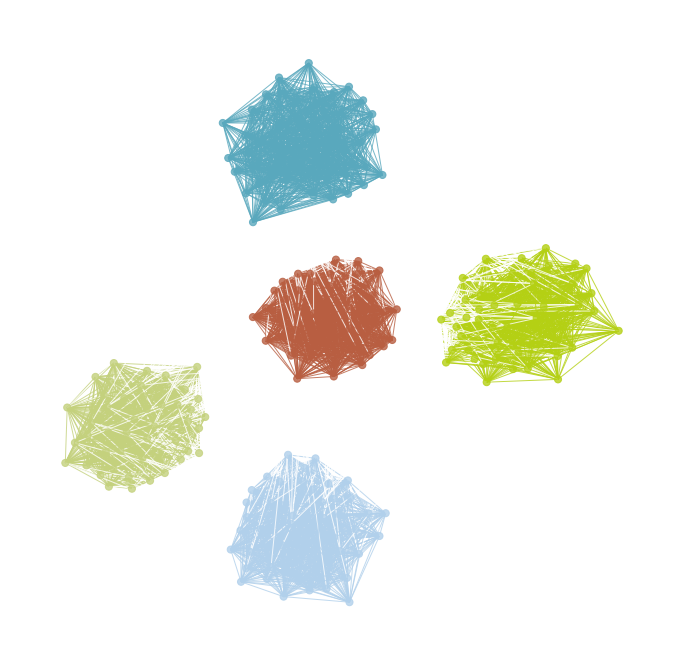

In [22]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain  # Louvain community detection
import random

# Parameters for the stochastic block model
sizes = [50, 50, 50, 50, 50]  # Five groups with 50 nodes each
probs = [[0.8, 0.05, 0.02, 0.02, 0.01],  # Higher connection probability within groups
         [0.05, 0.7, 0.02, 0.02, 0.01],
         [0.02, 0.02, 0.7, 0.05, 0.02],
         [0.02, 0.02, 0.05, 0.8, 0.03],
         [0.01, 0.01, 0.02, 0.03, 0.7]]  # Lower connection probability between groups

# Create a graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)])
             for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.axes().set_facecolor('black')  # Set the axes background color to black
pos = nx.spring_layout(G, seed=42, k=0.15)  # Fruchterman-Reingold layout for better separation
nx.draw(G, pos, node_color=node_color_map, edge_color=edge_colors, node_size=50, alpha=0.8, with_labels=False)
plt.axis('off')  # Hide the axes
plt.show()

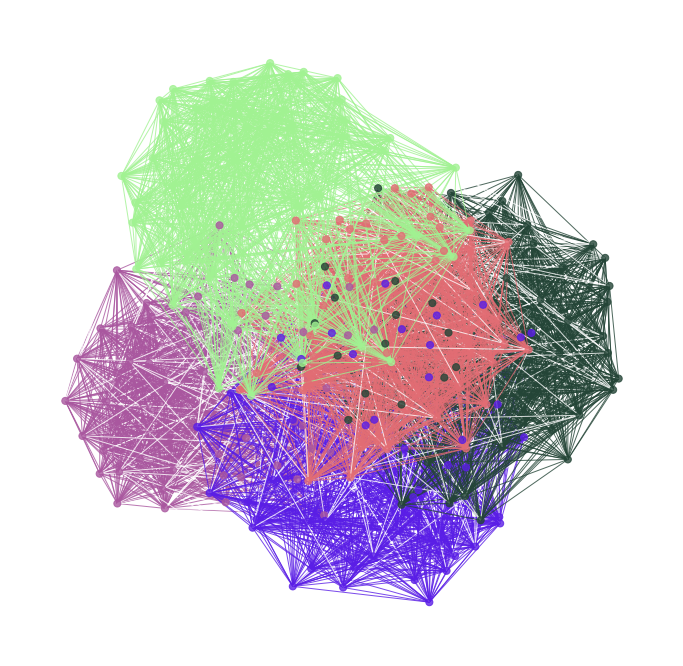

In [27]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain  # Louvain community detection
import random

# Parameters for the stochastic block model
sizes = [50, 50, 50, 50, 50]  # Five groups with 50 nodes each
probs = [[0.8, 0.05, 0.02, 0.02, 0.01],  # Higher connection probability within groups
         [0.05, 0.7, 0.02, 0.02, 0.01],
         [0.02, 0.02, 0.7, 0.05, 0.02],
         [0.02, 0.02, 0.05, 0.8, 0.03],
         [0.01, 0.01, 0.02, 0.03, 0.7]]  # Lower connection probability between groups

# Create a graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)])
             for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black
pos = nx.spring_layout(G, seed=42, k=1.2)  # Fruchterman-Reingold layout for better separation
nx.draw(G, pos, node_color=node_color_map, edge_color=edge_colors, node_size=50, alpha=0.8, with_labels=False)
plt.axis('off')  # Hide the axes
plt.show()


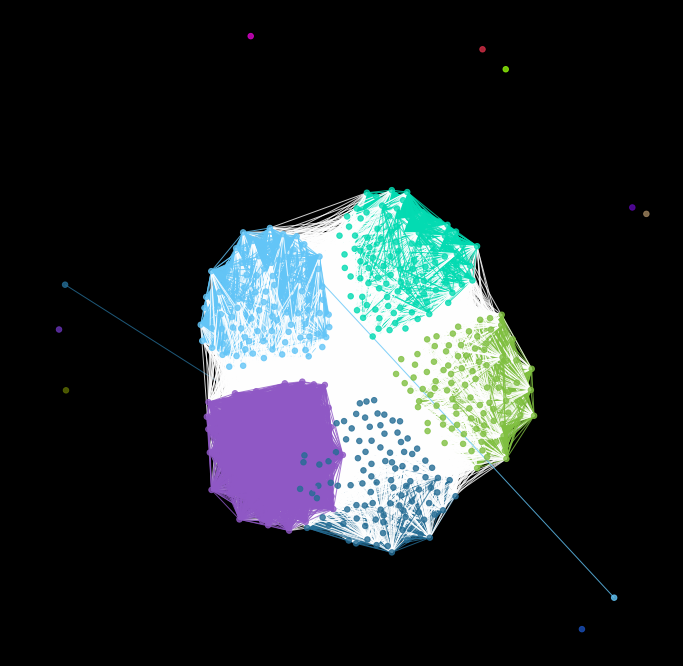

In [36]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 100

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities
# High probability for edges within the same group and lower between groups
probs = [
    [0.8, 0.1, 0.1, 0.1, 0.1],
    [0.1, 0.8, 0.1, 0.1, 0.1],
    [0.1, 0.1, 0.8, 0.1, 0.1],
    [0.1, 0.1, 0.1, 0.8, 0.1],
    [0.1, 0.1, 0.1, 0.1, 0.8]
]

# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Add some isolated nodes
num_isolated_nodes = 10
for i in range(num_isolated_nodes):
    G.add_node(G.number_of_nodes())
    # Connect each isolated node to a random node in the main groups with a low probability
    if random.random() < 0.1:  # 10% chance to connect
        target_node = random.choice(list(G.nodes())[:-num_isolated_nodes])  # Avoid connecting to another isolated node
        G.add_edge(G.number_of_nodes() - 1, target_node)

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation
pos = nx.spring_layout(G, seed=42, k=0.8)

# Draw the nodes and edges with curved edges
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=30, alpha=0.8)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, alpha=0.8, connectionstyle='arc3, rad=0.1')  # Curved edges
plt.axis('off')  # Hide the axes
plt.show()

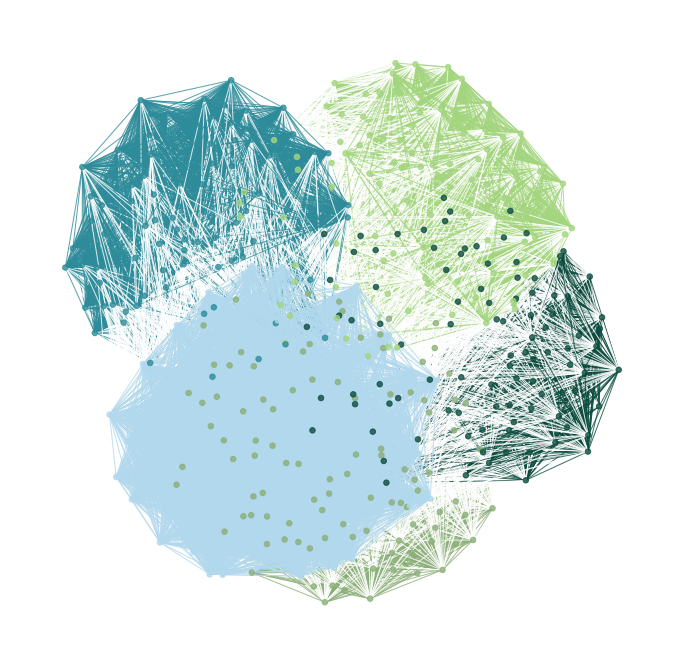

In [32]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 100

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities
# High probability for edges within the same group and lower between groups
probs = [
    [0.8, 0.1, 0.1, 0.1, 0.1],
    [0.1, 0.8, 0.1, 0.1, 0.1],
    [0.1, 0.1, 0.8, 0.1, 0.1],
    [0.1, 0.1, 0.1, 0.8, 0.1],
    [0.1, 0.1, 0.1, 0.1, 0.8]
]

# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black
pos = nx.spring_layout(G, seed=42, k=1.2)  # Fruchterman-Reingold layout for better separation
nx.draw(G, pos, node_color=node_color_map, edge_color=edge_colors, node_size=30, alpha=0.8, with_labels=False)
plt.axis('off')  # Hide the axes
plt.show()

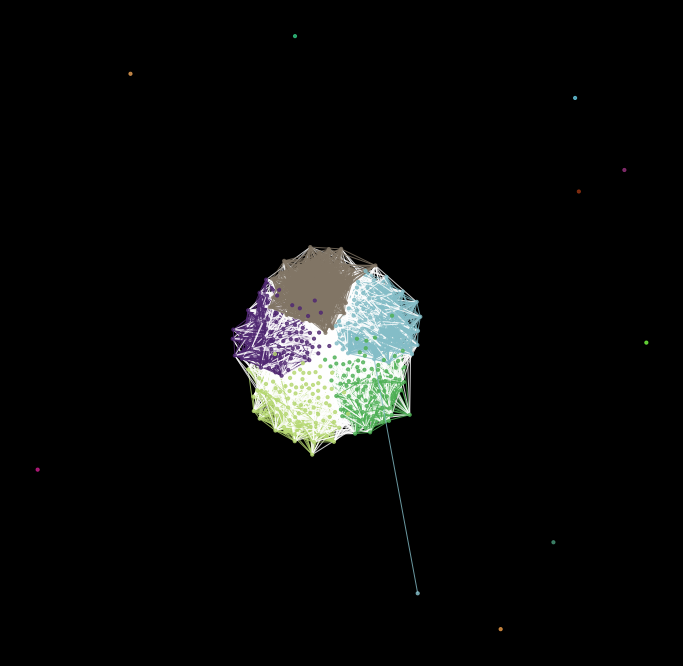

In [41]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 80

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities with fewer connections
# High probability for edges within the same group and much lower between groups
probs = [
    [0.3, 0.05, 0.05, 0.05, 0.05],
    [0.05, 0.3, 0.05, 0.05, 0.05],
    [0.05, 0.05, 0.3, 0.05, 0.05],
    [0.05, 0.05, 0.05, 0.3, 0.05],
    [0.05, 0.05, 0.05, 0.05, 0.3]
]

# Create the graph using the stochastic block model with fewer connections
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Add some isolated nodes
num_isolated_nodes = 10
for i in range(num_isolated_nodes):
    G.add_node(G.number_of_nodes())
    # Weakly connect isolated nodes to the main group with low probability
    if random.random() < 0.05:  # 5% chance to connect
        target_node = random.choice(list(G.nodes())[:-num_isolated_nodes])  # Avoid connecting to another isolated node
        G.add_edge(G.number_of_nodes() - 1, target_node)

# Apply the Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation
pos = nx.spring_layout(G, seed=42, k=0.3)  # Increase k for more spread-out groups

# Draw the nodes and edges with curved edges
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=10, alpha=0.8)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, alpha=0.8, connectionstyle='arc3, rad=0.2')  # Curved edges with higher curvature
plt.axis('off')  # Hide the axes
plt.show()

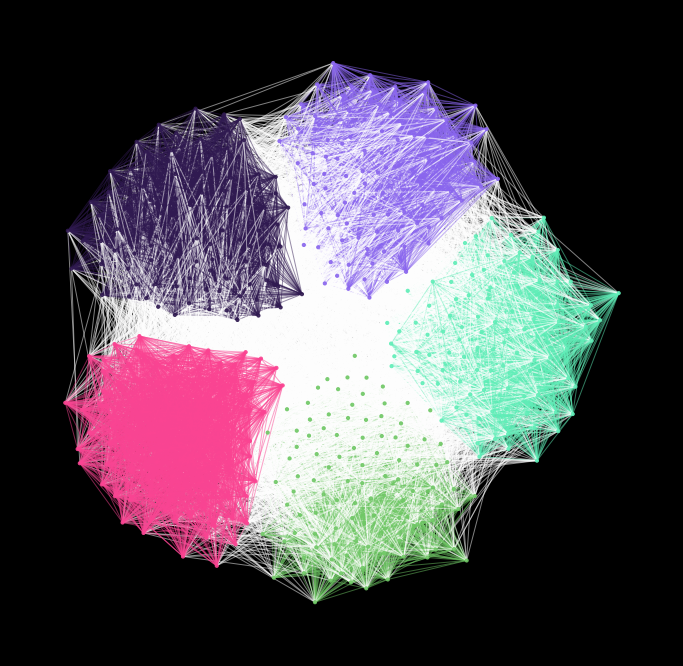

In [43]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 100

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities with a more balanced structure
# High probability for edges within the same group and lower between groups
probs = [
    [0.4, 0.05, 0.05, 0.05, 0.05],
    [0.05, 0.4, 0.05, 0.05, 0.05],
    [0.05, 0.05, 0.4, 0.05, 0.05],
    [0.05, 0.05, 0.05, 0.4, 0.05],
    [0.05, 0.05, 0.05, 0.05, 0.4]
]

# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation and group distinction
pos = nx.spring_layout(G, seed=42, k=0.5)  # Compact layout for clearer grouping

# Draw the nodes and edges with curved edges
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=10, alpha=0.9)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, alpha=0.5, connectionstyle='arc3, rad=0.3')  # Increased curvature for edges
plt.axis('off')  # Hide the axes
plt.show()

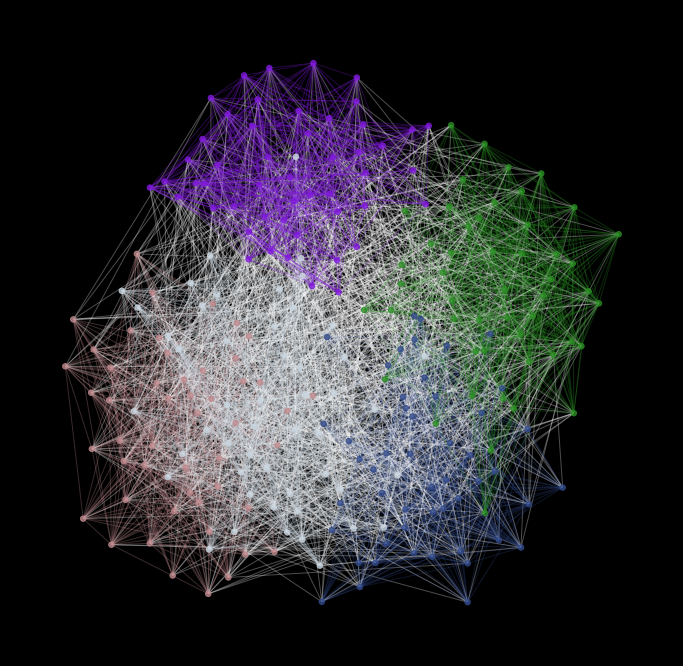

In [47]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 50

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities with a more balanced structure
# High probability for edges within the same group and lower between groups
probs = [
    [0.4, 0.05, 0.05, 0.05, 0.05],
    [0.05, 0.4, 0.05, 0.05, 0.05],
    [0.05, 0.05, 0.4, 0.05, 0.05],
    [0.05, 0.05, 0.05, 0.4, 0.05],
    [0.05, 0.05, 0.05, 0.05, 0.4]
]

# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation and group distinction
pos = nx.spring_layout(G, seed=42, k=0.7)  # Compact layout for clearer grouping

# Draw the nodes and edges with curved edges
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=30, alpha=0.8)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, alpha=0.3, connectionstyle='arc3, rad=0.3')  # Increased curvature for edges
plt.axis('off')  # Hide the axes
plt.show()

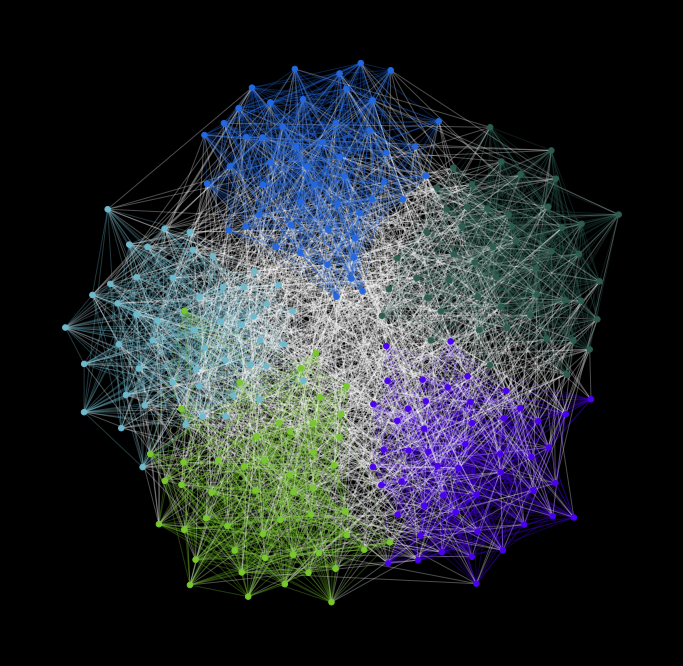

In [61]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 50

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities with a more balanced structure
probs = [
    [0.4, 0.05, 0.05, 0.05, 0.05],
    [0.05, 0.4, 0.05, 0.05, 0.05],
    [0.05, 0.05, 0.4, 0.05, 0.05],
    [0.05, 0.05, 0.05, 0.4, 0.05],
    [0.05, 0.05, 0.05, 0.05, 0.4]
]

# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation and group distinction
pos = nx.spring_layout(G, seed=42, k=0.4)  # Compact layout for clearer grouping

# Draw the nodes and edges with more pronounced curved edges
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=30, alpha=1)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, alpha=0.3, connectionstyle='arc3, rad=-1')  # Increased curvature for edges

plt.axis('off')  # Hide the axes
plt.show()

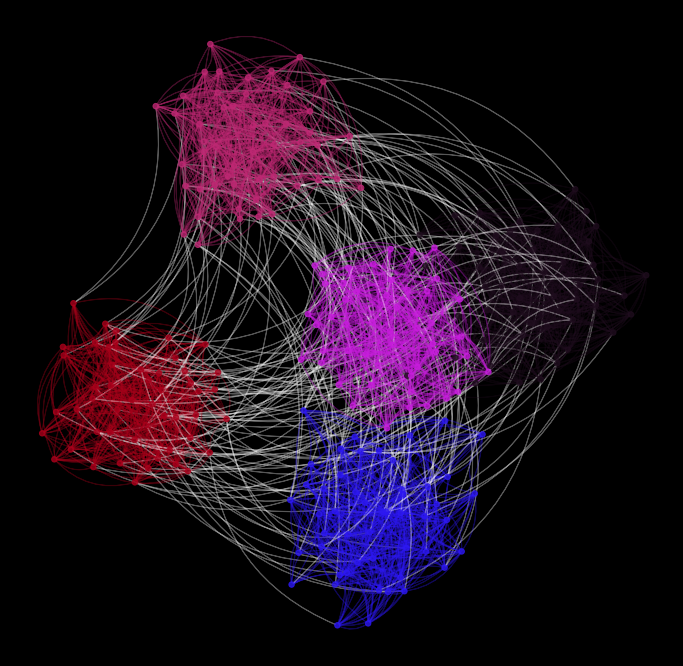

In [8]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random
from matplotlib.patches import FancyArrowPatch
from matplotlib.pyplot import gca

# Function to draw curved edges between nodes
def draw_curved_edges(G, pos, rad=0.2, edge_colors=None, alpha=0.5):
    ax = gca()
    for (u, v), color in zip(G.edges(), edge_colors):
        # Get positions of the nodes
        node_pos_u = pos[u]
        node_pos_v = pos[v]
        
        # Create a FancyArrowPatch to represent a curved edge
        arrow = FancyArrowPatch(node_pos_u, node_pos_v, connectionstyle=f"arc3,rad={rad}",
                                color=color, lw=1, alpha=alpha)
        ax.add_patch(arrow)

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 50

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities with a more balanced structure
probs = [
    [0.4, 0.01, 0.01, 0.01, 0.01],
    [0.01, 0.4, 0.01, 0.01, 0.01],
    [0.01, 0.01, 0.4, 0.01, 0.01],
    [0.01, 0.01, 0.01, 0.4, 0.01],
    [0.01, 0.01, 0.01, 0.01, 0.4]
]



# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}

# Create node colors based on their community
node_color_map = [color_map[partition[node]] for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition[u] == partition[v]:
        edge_colors.append(color_map[partition[u]])  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation and group distinction
pos = nx.spring_layout(G, seed=42, k=0.5)  # Compact layout for clearer grouping

# Draw the nodes
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=30, alpha=0.8)

# Draw the curved edges
draw_curved_edges(G, pos, rad=0.3, edge_colors=edge_colors, alpha=0.3)

plt.axis('off')  # Hide the axes
plt.show()

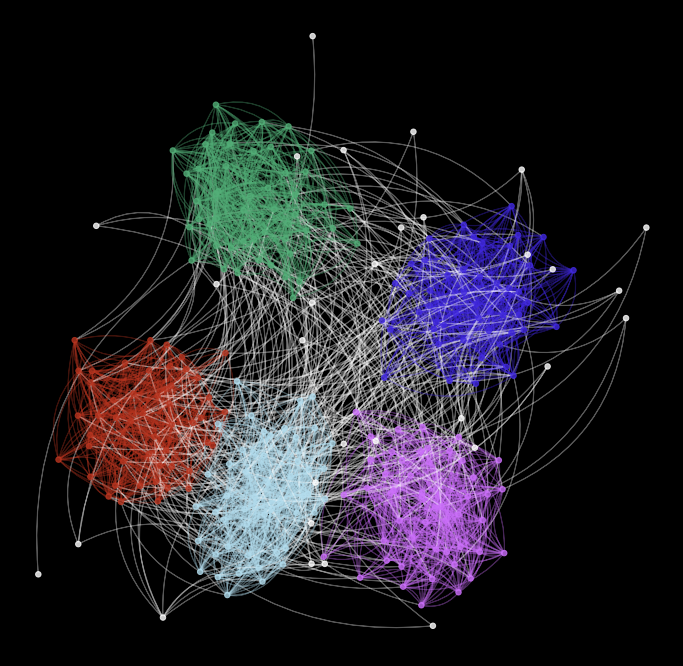

In [26]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random
from matplotlib.patches import FancyArrowPatch
from matplotlib.pyplot import gca

# Function to draw curved edges between nodes
def draw_curved_edges(G, pos, rad=0.2, edge_colors=None, alpha=0.5):
    ax = gca()
    for (u, v), color in zip(G.edges(), edge_colors):
        # Get positions of the nodes
        node_pos_u = pos[u]
        node_pos_v = pos[v]
        
        # Create a FancyArrowPatch to represent a curved edge
        arrow = FancyArrowPatch(node_pos_u, node_pos_v, connectionstyle=f"arc3,rad={rad}",
                                color=color, lw=1, alpha=alpha)
        ax.add_patch(arrow)

# Function to add new nodes and connect them randomly to existing nodes
def add_random_nodes(G, n, max_edges_per_new_node=3):
    current_num_nodes = G.number_of_nodes()
    for i in range(n):
        new_node = current_num_nodes + i
        G.add_node(new_node)
        
        # Randomly connect the new node to some existing nodes
        num_edges = random.randint(1, max_edges_per_new_node)
        existing_nodes = list(G.nodes())[:-n]  # Exclude newly added nodes
        connections = random.sample(existing_nodes, num_edges)
        
        for existing_node in connections:
            G.add_edge(new_node, existing_node)

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 50

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities with a more balanced structure
probs = [
    [0.4, 0.01, 0.01, 0.01, 0.01],
    [0.01, 0.4, 0.01, 0.01, 0.01],
    [0.01, 0.01, 0.4, 0.01, 0.01],
    [0.01, 0.01, 0.01, 0.4, 0.01],
    [0.01, 0.01, 0.01, 0.01, 0.4]
]

# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Add 10 random new nodes with connections
add_random_nodes(G, n=30, max_edges_per_new_node=10)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}
default_color = "#FFFFFF"  # White as the default color for new nodes

# Create node colors based on their community
node_color_map = [color_map.get(partition.get(node), default_color) for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition.get(u) == partition.get(v):
        edge_colors.append(color_map.get(partition.get(u), default_color))  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation and group distinction
pos = nx.spring_layout(G, seed=42, k=0.5)  # Compact layout for clearer grouping

# Draw the nodes
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=30, alpha=0.8)

# Draw the curved edges
draw_curved_edges(G, pos, rad=0.3, edge_colors=edge_colors, alpha=0.3)

plt.axis('off')  # Hide the axes
plt.show()


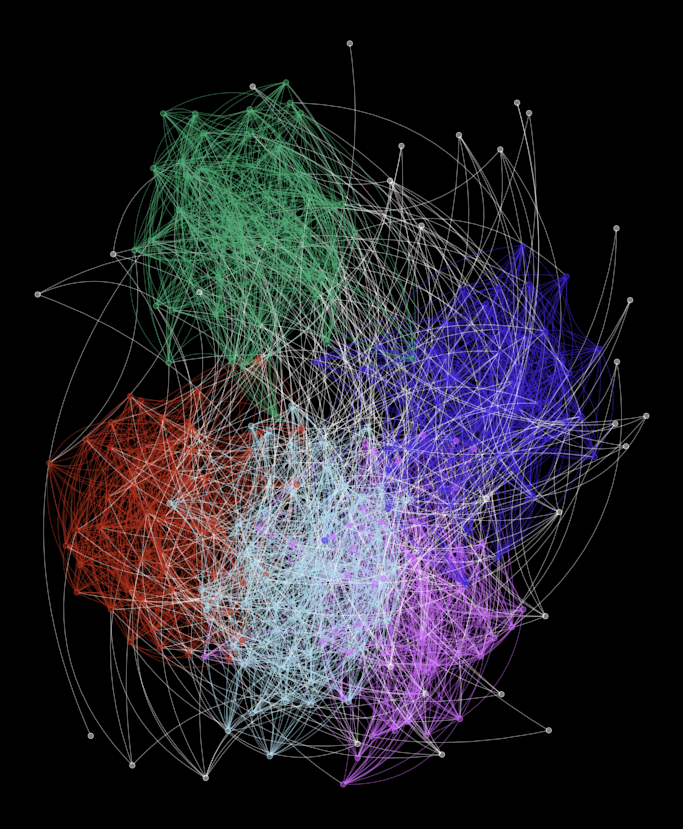

In [28]:
#### ESTA QUE ES CON LA COnstruccion de ensima
# Visualize the network with a black background
plt.figure(figsize=(12, 15), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation and group distinction
pos = nx.spring_layout(G, seed=42, k=0.7)  # Compact layout for clearer grouping

# Draw the nodes
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=30, alpha=0.5)

# Draw the curved edges
draw_curved_edges(G, pos, rad=0.3, edge_colors=edge_colors, alpha=0.3)

plt.axis('off')  # Hide the axes
plt.show()

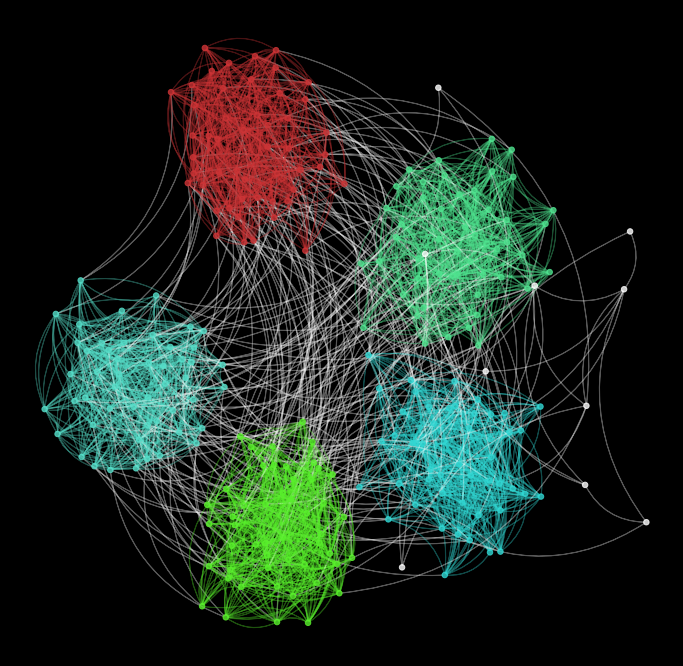

In [16]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain
import random
from matplotlib.patches import FancyArrowPatch
from matplotlib.pyplot import gca

# Function to draw curved edges between nodes
def draw_curved_edges(G, pos, rad=0.2, edge_colors=None, alpha=0.5):
    ax = gca()
    for (u, v), color in zip(G.edges(), edge_colors):
        # Get positions of the nodes
        node_pos_u = pos[u]
        node_pos_v = pos[v]
        
        # Create a FancyArrowPatch to represent a curved edge
        arrow = FancyArrowPatch(node_pos_u, node_pos_v, connectionstyle=f"arc3,rad={rad}",
                                color=color, lw=1, alpha=alpha)
        ax.add_patch(arrow)

# Function to add new nodes with higher intra-connections
def add_random_nodes_with_intra_connections(G, n, intra_connection_prob=0.7, max_edges_per_new_node=3):
    current_num_nodes = G.number_of_nodes()
    new_nodes = []
    
    for i in range(n):
        new_node = current_num_nodes + i
        G.add_node(new_node)
        new_nodes.append(new_node)
        
        # Randomly connect the new node to some existing nodes and new nodes
        num_edges = random.randint(1, max_edges_per_new_node)
        for _ in range(num_edges):
            if random.random() < intra_connection_prob and len(new_nodes) > 1:  # Higher chance to connect to other new nodes
                other_new_node = random.choice(new_nodes[:-1])  # Exclude the current node
                G.add_edge(new_node, other_new_node)
            else:
                existing_nodes = list(G.nodes())[:-n]  # Exclude newly added nodes from existing nodes
                existing_node = random.choice(existing_nodes)
                G.add_edge(new_node, existing_node)

# Define the number of nodes per group and the number of groups
num_groups = 5
nodes_per_group = 50

# Define the sizes of each group
sizes = [nodes_per_group] * num_groups

# Define the connection probabilities with a more balanced structure
probs = [
    [0.4, 0.01, 0.01, 0.01, 0.01],
    [0.01, 0.4, 0.01, 0.01, 0.01],
    [0.01, 0.01, 0.4, 0.01, 0.01],
    [0.01, 0.01, 0.01, 0.4, 0.01],
    [0.01, 0.01, 0.01, 0.01, 0.4]
]

# Create the graph using the stochastic block model
G = nx.stochastic_block_model(sizes, probs, seed=42)

# Apply Louvain community detection algorithm
partition = community_louvain.best_partition(G)

# Add 10 random new nodes with more intra-connections
add_random_nodes_with_intra_connections(G, n=10, intra_connection_prob=0.7, max_edges_per_new_node=5)

# Create a color map based on the partition (cluster) assignments
unique_clusters = set(partition.values())
color_map = {cluster: "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)]) for cluster in unique_clusters}
default_color = "#FFFFFF"  # White as the default color for new nodes

# Create node colors based on their community
node_color_map = [color_map.get(partition.get(node), default_color) for node in G.nodes()]

# Create edge colors based on whether the edge is within the same community or between communities
edge_colors = []
for u, v in G.edges():
    if partition.get(u) == partition.get(v):
        edge_colors.append(color_map.get(partition.get(u), default_color))  # Same color as the nodes within the community
    else:
        edge_colors.append("white")  # Cross-community edges are white

# Visualize the network with a black background
plt.figure(figsize=(12, 12), facecolor='black')
plt.gca().set_facecolor('black')  # Set the axes background color to black

# Create a spring layout for better separation and group distinction
pos = nx.spring_layout(G, seed=42, k=0.5)  # Compact layout for clearer grouping

# Draw the nodes
nx.draw_networkx_nodes(G, pos, node_color=node_color_map, node_size=30, alpha=0.8)

# Draw the curved edges
draw_curved_edges(G, pos, rad=0.3, edge_colors=edge_colors, alpha=0.3)

plt.axis('off')  # Hide the axes
plt.show()

In [ ]:
probs = [
    [0.4, 0.005, 0.005, 0.005, 0.005],
    [0.005, 0.4, 0.005, 0.005, 0.005],
    [0.005, 0.005, 0.4, 0.005, 0.005],
    [0.005, 0.005, 0.005, 0.4, 0.005],
    [0.005, 0.005, 0.005, 0.005, 0.4]
]

In [30]:
!pip install fa2

  error: subprocess-exited-with-error
  
  exit code: 1
  
  [31 lines of output]
  Installing fa2 package (fastest forceatlas2 python implementation)
  
  >>>> Cython is installed?
  Cython is not installed; using pre-generated C files if available
  Please install Cython first and try again if you face any installation problems
  
  >>>> Are pre-generated C files available?
  Yes
  
  >>>> Starting to install!
  
  running bdist_wheel
  running build
  running build_py
  creating build\lib.win-amd64-cpython-39\fa2
  copying fa2\fa2util.py -> build\lib.win-amd64-cpython-39\fa2
  copying fa2\forceatlas2.py -> build\lib.win-amd64-cpython-39\fa2
  copying fa2\__init__.py -> build\lib.win-amd64-cpython-39\fa2
  running egg_info
  writing fa2.egg-info\PKG-INFO
  writing dependency_links to fa2.egg-info\dependency_links.txt
  writing requirements to fa2.egg-info\requires.txt
  writing top-level names to fa2.egg-info\top_level.txt
  reading manifest file 'fa2.egg-info\SOURCES.txt'
  reading 


     -------------------------------------- 435.4/435.4 kB 1.7 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
     ---------------------------------------- 57.6/57.6 kB 1.5 MB/s eta 0:00:00
   ---------------------------------------- 78.4/78.4 kB 2.2 MB/s eta 0:00:00
Failed to build fa2


  copying fa2\fa2util.pxd -> build\lib.win-amd64-cpython-39\fa2
  running build_ext
  building 'fa2.fa2util' extension
  error: Microsoft Visual C++ 14.0 or greater is required. Get it with "Microsoft C++ Build Tools": https://visualstudio.microsoft.com/visual-cpp-build-tools/
  [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for fa2
ERROR: Could not build wheels for fa2, which is required to install pyproject.toml-based projects

[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [31]:
!pip install curved_edges

ERROR: Could not find a version that satisfies the requirement curved_edges (from versions: none)
ERROR: No matching distribution found for curved_edges

[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip
